# Exploratory functional analysis notebook: 
<p>The goal of this notebook is produce a functional connectivity matrix between neurons most fit for graph theory analysis.
This would include several decision points and can be confirmed and validated through several means. In essence we want connectivity which makes sense
Given our nodes, one should not expect highly distant correlation matrix. Finally, we'll want to examine functional connectivities across fish and datasets and see how they differ</p>

Here are some suggestions or *decision points* for how to carry this analysis:
* Fine-tune preprocessing step so its tailored to the fish and without artefacts. 
* Reconstruct neuronal traces from only the components which explain the most variance or those without variance
* Attempt different functional connectivity measures: including structural, effective and correlative. These might be able to produce different graphs according to their implementation.
* Threshold correlation matrices
* Regress out 'unimportant' neural variation such as motor activity / global activity

Note: Not all distances fit, for example euclidian distance is difficult to normalize to a value where correlations already exist 

Here are some suggestions for how to validate what we do:
* Examine correlations as a function of distance: If everything is correct then in essence most correlations should decrease as we go away with distance
* Examine functional connectivity with known structural connectivity. For example nodes from motor areas hindbrain can expect some anti-correlation during periods 
* Predict behavioural state from functional connectivity
* Cluster activity to see the validity of functional connectivity towards given correlations and modularity
* Examine functional differences, For example: we can build a motor regressor for left and right and see the differences for how good the data is. Caudal hindbrain are highly correlated  

Current problems:
* Almost no-anti correlations or negative correlation values in some fish
* Correlations are high across distant nodes which isn't replicated from the paper

In [31]:
# Import widget for interactive notebook

# import functional_analysis as fa
import numpy as np
from numpy.testing import assert_array_almost_equal
from  matplotlib import pyplot as plt

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from pathlib import Path
import json
import matplotlib.gridspec as gridspec
import seaborn as sns
from datetime import datetime

from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE

from scipy.spatial import distance_matrix
import pandas as pd
from nilearn.connectome import ConnectivityMeasure

# For saving
import h5py
import flammkuchen as fl


# Import from parent folder
import os
import sys
import inspect

###################
sys.path.append(os.path.join(os.path.dirname(sys.path[0]),'code'))
# os.chdir('../Graph-analysis-michael')
# sys.path.append('..')
# sys.path.append('./code')
# sys.path.append('')
import mypatterns as mpt

# TODO: Organize the import functions amidst the files
import mutils as mu
import graph_analysis as ga
import functional_analysis as fa
import behaviour_analysis as ba

In [32]:
import importlib
imported_module = importlib.import_module("mutils")
importlib.reload(imported_module)
imported_module = importlib.import_module("graph_analysis")
importlib.reload(imported_module)
imported_module = importlib.import_module("functional_analysis")
importlib.reload(imported_module)
imported_module = importlib.import_module("behaviour_analysis")
importlib.reload(imported_module)

<module 'behaviour_analysis' from 'c:\\Users\\micha\\Documents\\Projects\\Python projects\\Organizational Principles in Zebrafish\\Code\\Graph-analysis-michael\\code\\behaviour_analysis.py'>

In [33]:
# Set default parameters
def default_param(dataset_name, fish_id, paths, **kwargs):
  '''
  Define default parameters
  '''
  # Configure the path locations
  param = {}
  func_d = {}
  
  # File parameters
  param['dataset type'] = dataset_name  # The dataset name for the experiment
  param['fish_id'] = fish_id            # The fish id for the experiment

  if os.path.isdir(Path(paths[0])):
    master_path = Path(paths[0])
    trace_all, ROIs_all, zf, protocol_params, z_res = mu.read_data(fish_id, master_path)
  else :
    master_path = Path(paths[1])
    trace_all, ROIs_all, zf, protocol_params, z_res = mu.read_data(fish_id, master_path)

  # Save Traces
  func_d['traces'] = {}
  func_d['traces']['original'] = trace_all
  func_d['coordinates'] = {}
  func_d['coordinates']['ROIS'] = ROIs_all
  
  # Save control parameters
  param['protocol_params'] = protocol_params
  param['zf'] = zf

  # Decision for functional connectivity construction:
  # 
  func_dec = 'SVD'
  regressor_dec = 'None'
  thresh_dec = 'constant'
  connectivity_dec = 'correlation'

  # Add decision variables
  param['decision variables'] = {}
  param['decision variables']['traces'] = {'rec_type': func_dec, 'n_comp': 200}
  param['decision variables']['regressor'] = {'reg_type': regressor_dec}
  param['decision variables']['connectivity'] = {'con_type': connectivity_dec}
  param['decision variables']['parcellation'] = {}
  # param['decision variables']['connectivity'] = {'con_type': 'granger causality', 'maxdelay' : 5, 'alpha' : 0.05}  # Granger causality
  param['decision variables']['thresh'] = {'thresh_type': thresh_dec, 'cor_threshold' : 0.6}

  
  # External parameters if any
  for k in kwargs:
      param[k] = kwargs[k]
  return param, func_d

In [34]:
# Load fish data 
fish_id = "220221_f1"
paths = [r'\\FUNES\Shared\experiments\E0040_motions_cardinal\v21\ls\h2b_wb', r'Z:\Shared\experiments\E0040_motions_cardinal\v21\ls\h2b_wb']
if os.path.isdir(Path(paths[0])):
    master_path = Path(paths[0])
    trace_all, ROIs_all, zf, protocol_params, z_res = mu.read_data(fish_id, master_path)
else:
    master_path = Path(paths[1])
    trace_all, ROIs_all, zf, protocol_params, z_res = mu.read_data(fish_id, master_path)

Keys: <KeysViewHDF5 ['anatomy_stack', 'areas', 'coords', 'rois_stack', 'suite2p_idxs', 'traces']>


In [35]:
# Load configuration to save as JSON later
param_dict, func_d = default_param('Closed loop spontaneous', fish_id, paths)

Keys: <KeysViewHDF5 ['anatomy_stack', 'areas', 'coords', 'rois_stack', 'suite2p_idxs', 'traces']>


In [36]:
# Create stamp for today's run
FORMAT = '%Y%m%d'
timestamp = datetime.now().strftime(FORMAT)

# Set up saving path for figures
fig_save_path = "../figures/{}/{}".format(fish_id, timestamp)
Path(fig_save_path).mkdir(parents=True, exist_ok=True)
# Path("../figures").mkdir(parents=True, exist_ok=True)

#### Perform preprocessing: 
This section will include: 
- Play with different parameter of processing until data looks fine
- Examine statistics of preprocessed data

In [37]:
# Perform preprocessing of traces
nantest = np.sum(trace_all,axis = -1)
TC = np.squeeze(trace_all[np.argwhere(~np.isnan(nantest)),:])
fc_baseline=1/300  # Hz, 5 min period
TC=mpt.clean(TC, sampling_frq = zf, highpass = fc_baseline)

# Save preprocessed traces
func_d['traces']['preprocessed_traces'] = TC
# np.save(fig_save_path + '/preprocessed_traces.npy', TC)

### Examine neuronal traces according to original, preprocessing and reconstruction:
The goal: Get an intuition about the dataset and noises and also prepare differently processed neuronal sets for graph analysis.
This will include 
- Raw traces
- Preprocessed traces for highpass and zscore
- Preprocessed traces that were reconstructed using SVD / PCA / Other dimentionality techniques through the main principal components

c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\seaborn\rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required po

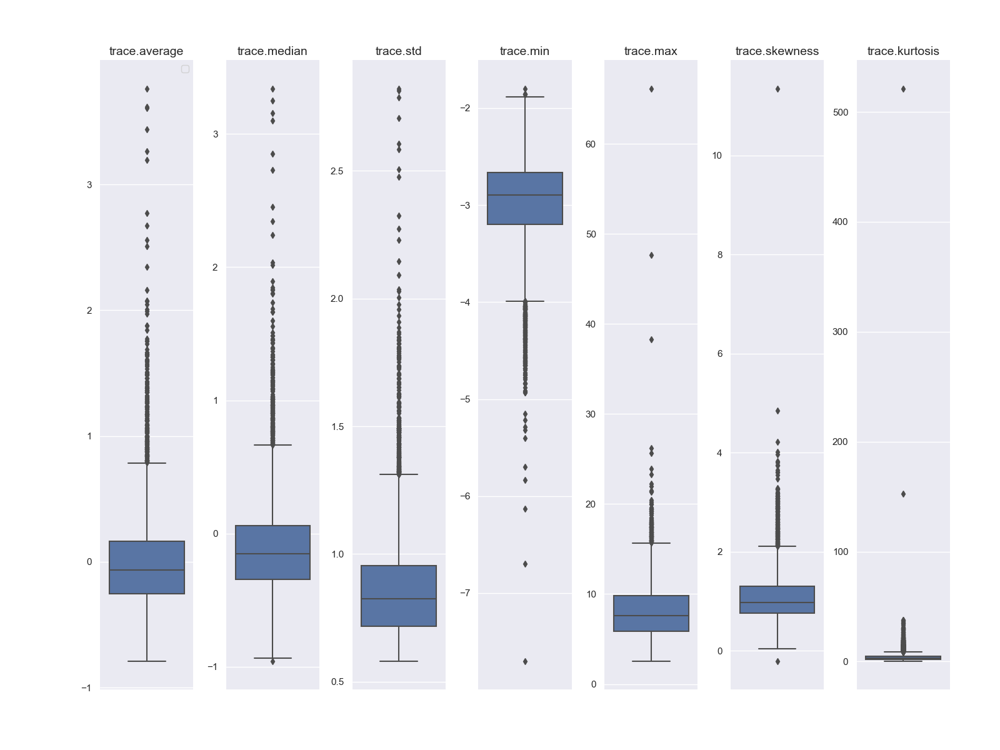

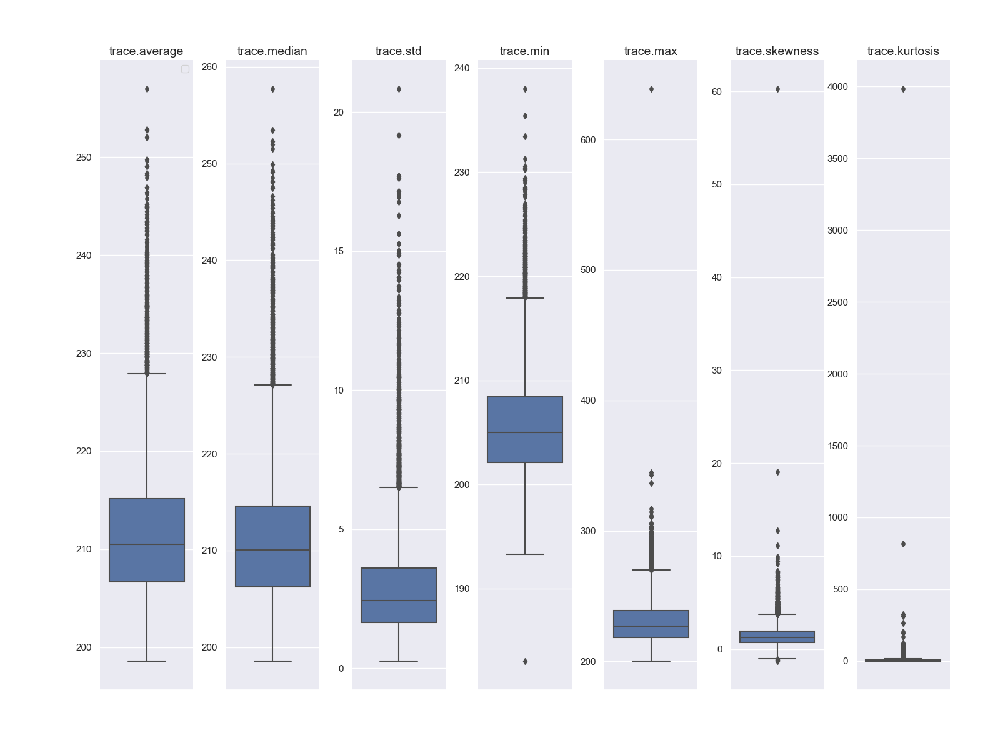

In [38]:
# Examine the statistics of preprocessed data
sns.set_theme()
df_trace_features = mu.extract_features(TC)
headers = df_trace_features .columns.values.tolist()[1:]
f = mu.plot_boxplot_features(df_trace_features, headers)

# 
df_trace_org_features = mu.extract_features(trace_all)
headers_org = df_trace_org_features.columns.values.tolist()[1:]
f_org = mu.plot_boxplot_features(df_trace_org_features, headers_org)

# Save the distribution after preprocessing: 
f.savefig(fig_save_path + '/preprocessed_traces statistics plot.png')
f_org.savefig(fig_save_path + '/original traces statistics plot.png')
sns.set_theme(style="white", palette=None) # Return the theme to original

# TODO: Examine statistics of other forms of data

# TODO: Examine corresponding histograms of values

In [39]:

def _recon_traces_custom(traces, n_start: int = 1, n_end: int = 2) -> np.ndarray:
    """
    Reconstruct traces from selected componenets
    Input:
    - Traces: Neuronal traces provided  neurons x time matrix form
    - n_start: The starting most explained component
    - n_end: The last most explained component
    Returns
    - custom_recon_traces: The reconstructed traces from selected components

    """
    U,s,V = np.linalg.svd(traces)
    # recon_img = U @ s[1:10] @ V
    S = np.zeros(np.shape(traces))
    for i in range(n_start, n_end):
        S[i,i] = s[i]
    custom_recon_traces = U @ S @ V
    return custom_recon_traces

def reconstruct_traces(traces: np.ndarray, n_comp: int = 200, rec_type: str = 'SVD', comp_range: tuple = None, 
        plot_expl: bool = False, fig_title: str = '', ax = None) -> np.ndarray:
    """
    Reconstructs traces using principal components 
    Input:
    - traces: (np.ndarray n x t ) matrix containing traces across time points (Note: Make sure they're in the right orientation)
    - n_com: The amount of components used in reconstruction of traces from principal components 
    - rec_type: The type of dimentionality reduction to use in reconstruction
    - plot_expl: Bool

    Returns:
    - Reconstructed traces
    """
    loss = 0 
    if rec_type == 'SVD':
        # Reduce and Reconstruct for preprocssed traces
        svd = TruncatedSVD(n_components=n_comp)
        reduced_traces = svd.fit_transform(traces)
        reconstructed_traces = svd.inverse_transform(reduced_traces)
        explained_var = svd.explained_variance_ratio_

        # Calculate the loss from SVD
        loss = np.sum((traces - reconstructed_traces) ** 2, axis=1).mean()

    elif rec_type == 'custom_SVD':
        # Reconstruct from custom selected
        start_comp,end_comp = comp_range
        reconstructed_traces = _recon_traces_custom(traces, start_comp, end_comp)
        loss = np.sum((traces - reconstructed_traces) ** 2, axis=1).mean()

    elif rec_type == 'PCA':
        # Reconstruct using PCA:
        pca = PCA(n_components=n_comp)
        pca.fit(traces)
        # U, S, VT = np.linalg.svd(traces - traces.mean(0))
        # assert_array_almost_equal(VT[:n_comp], pca.components_) # Verify components are close to equal
        
        # Calculate the loadings accordingly 
        traces_pca = pca.transform(traces)
        # traces_pca2 = (traces - pca.mean_).dot(pca.components_.T) # Why is it good practice? to substract pca mean?
        # assert_array_almost_equal(traces_pca, traces_pca2) # Verify transformed traces close to equal

        # Traces reconstruction
        reconstructed_traces = pca.inverse_transform(traces_pca)
        # reconstructed_traces2 = traces_pca.dot(pca.components_) + pca.mean_
        # assert_array_almost_equal(reconstructed_traces, reconstructed_traces2)

        # Projection loss
        # TODO: Add a loss paramer for all calculations
        loss = np.sum((traces - reconstructed_traces) ** 2, axis=1).mean()

        explained_var = pca.explained_variance_ratio_

    elif rec_type == 'tSNE':
        # TODO: Finish implementing tSNE (Should be used for visualization purposes primarily)
        tsne = TSNE(random_state=0)
        transients_emb = tsne.fit_transform(traces)

    # Examine the different axis
    if plot_expl:
        f_explained, var_axes = plt.subplots(1,2,figsize=(15,5))
        mu.examine_explained_variance(explained_var, n_comp, var_ax=var_axes[0], title=fig_title)
        f_explained.savefig(fig_save_path + '/explained variance by models plot.png')
    
    return reconstructed_traces

c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will

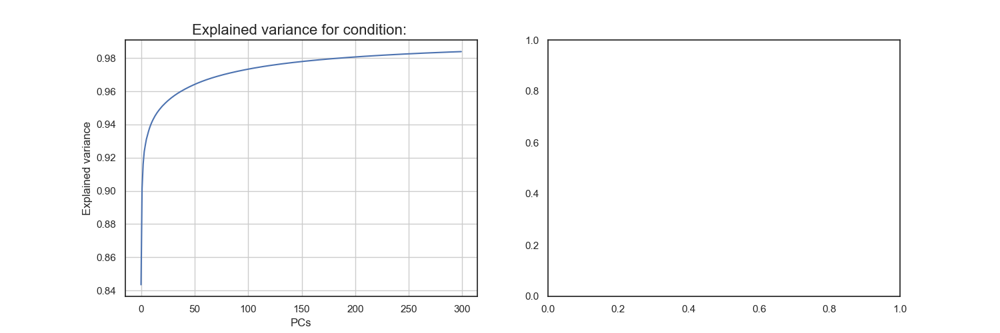

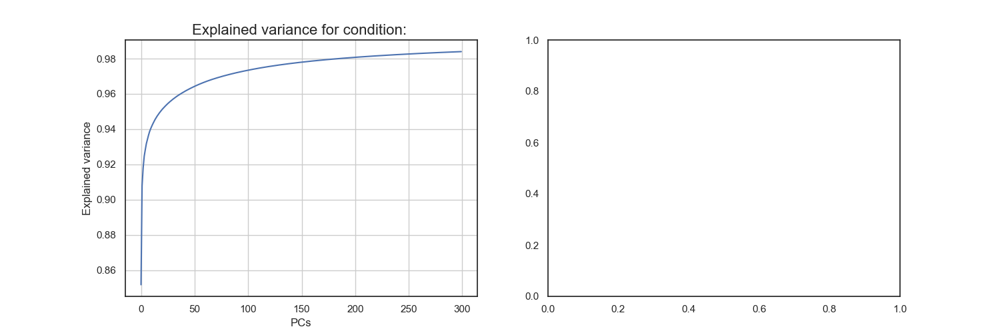

In [40]:
# Perform reconstruction
# TODO: Perform the same reconstruction for DMD:
recon_traces_svd = reconstruct_traces(trace_all, n_comp = 300, rec_type = 'SVD', plot_expl=True)
recon_traces_pca = reconstruct_traces(trace_all, n_comp = 300, rec_type = 'PCA', plot_expl=True)

# Save the traces as well
# np.save(fig_save_path + '/connectivity_mat.npy', recon_traces_pca)

c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)


Traces will be spread 11 units apart
Traces will be spread 234 units apart
Traces will be spread 232 units apart
Traces will be spread 232 units apart


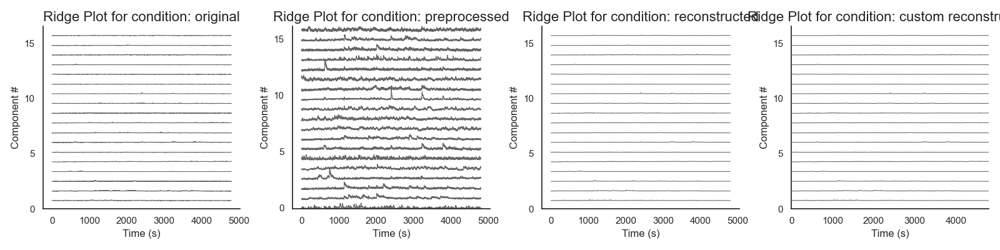

In [41]:
# TODO Add random sub-sampling from population of traces
# Plot the traces to examine the quality of the reconstruction
n_neurons = 20
f_traces, traces_axes = plt.subplots(1,4,figsize=(16,4))
mu.plot_neuronal_ridgeplot(TC.T, n_neurons , 1, title="preprocessed", traces_ax=traces_axes[1])
mu.plot_neuronal_ridgeplot(trace_all, n_neurons , 1, title="original", traces_ax=traces_axes[0])
mu.plot_neuronal_ridgeplot(recon_traces_svd, n_neurons , 1, title="reconstructed", traces_ax=traces_axes[2])
mu.plot_neuronal_ridgeplot(recon_traces_pca, n_neurons , 1, title="custom reconstructed", traces_ax=traces_axes[3])

# 
plt.tight_layout()
f_traces.savefig(fig_save_path + '/ridge plot traces.png')
# TODO: Add examination of behaviour data with 

c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)


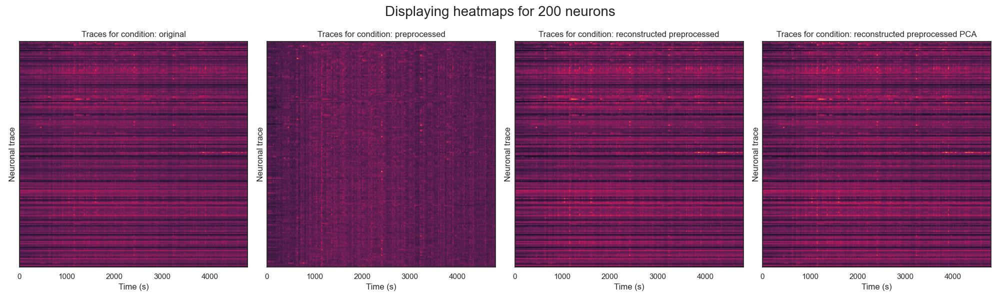

In [42]:
# TODO: Implement random subsampling here
# Examine traces after different preprocessing steps
fig_heatmap, axes = plt.subplots(1, 4, figsize=(20, 6))
display_n_traces = 200
fig_heatmap.suptitle('Displaying heatmaps for {} neurons'.format(display_n_traces),size=20)
mu.plot_heatmap(trace_all[:display_n_traces ,:], axes[0], plot_title='original')
mu.plot_heatmap(TC.T[:display_n_traces ,:], axes[1], plot_title='preprocessed')
mu.plot_heatmap(recon_traces_svd[:display_n_traces ,:], axes[2], plot_title='reconstructed preprocessed')  # Reconstructed from preprocessing dataset
mu.plot_heatmap(recon_traces_pca[:display_n_traces ,:], axes[3], plot_title='reconstructed preprocessed PCA')  # Reconstructed from preprocessing dataset
plt.tight_layout()
fig_heatmap.savefig(fig_save_path + '/traces heatmap for {} neurons plot.png'.format(display_n_traces))

#### **Decision point** - Select the traces to use for connectivity:
Select which dataset to work on and under which conditions:
* Raw dataset
* Preprocessed dataset condition
* Reconstructed dataset (Which dimentionality reduction to reconstruct with which principal components)

c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)


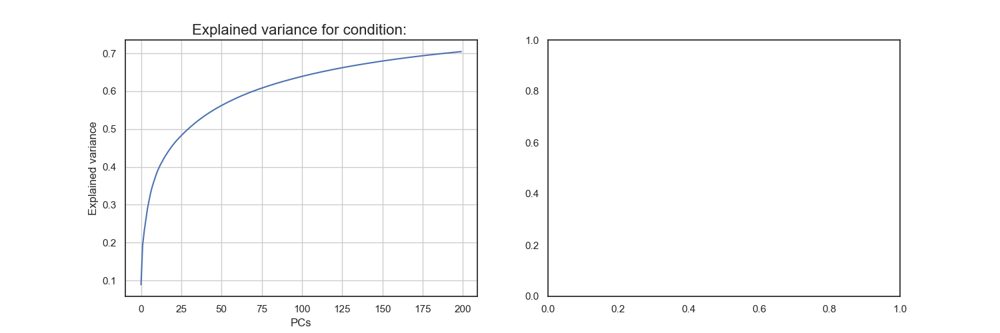

In [43]:
# Reconstruct traces for decision pipeline
selected_traces = reconstruct_traces(TC.T, **param_dict['decision variables']['traces'], plot_expl=True).T

# Save the traces as well
func_d['traces']['selected'] = selected_traces

C:\Users\micha\AppData\Roaming\Python\Python38\site-packages\sklearn\metrics\pairwise.py:58: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
C:\Users\micha\AppData\Roaming\Python\Python38\site-packages\sklearn\metrics\pairwise.py:58: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
C:\Users\micha\AppData\Roami

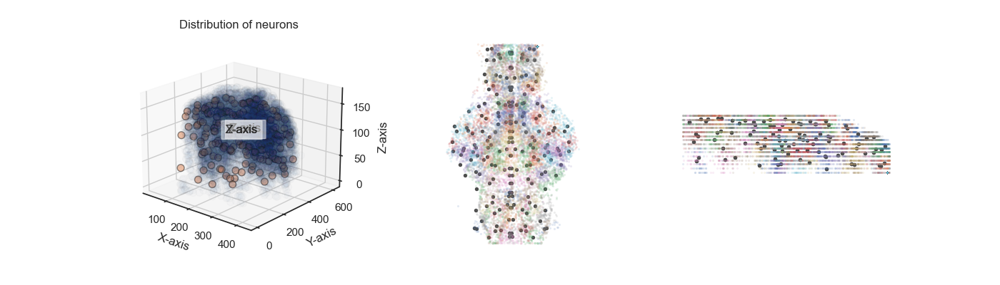

In [44]:
# Make Interactive
%matplotlib widget
# TODO: This can be only run once, fix it or take note that the notebook can't run this cell twice
# TODO: Add option for controlling parcellation parameters
# Spatially parcellate our traces
XYZ, LR_centers, indices, coord_tuple = ga.parcellate_zebrafish_brain(ROIs_all, z_res, nantest)

# Sanity check that parcellation is infact correct
fig = plt.figure(figsize=(14,4))

# Create subplots
ax1 = fig.add_subplot(1, 3, 1, projection='3d')
ax2 = fig.add_subplot(1, 3, 2)
ax3 = fig.add_subplot(1, 3, 3)
# ax1 = plt.subplot(311,  subplot_kw=dict(projection='3d'))
# ax2 = plt.subplot(312)
# ax3 = plt.subplot(313)

ga.plot_3d_projection(XYZ, ax=ax1,dot_size=50,transparency=0.015)
ga.plot_3d_projection(LR_centers, ax=ax1,dot_size=50)
fig.savefig(fig_save_path + '/3D anatomy of centroid centers plot.png')

# Plot the clustering locations
axs = [ax2, ax3]
ga.plot_spatial_node_clustering(coord_tuple, indices, axs,  nClus = 200)
fig.suptitle('Parcellations after K-means spatial clusterings')

# Save the centers

np.save(fig_save_path + '/nodes_coordinates.npy', LR_centers)
func_d['coordinates']['node centers'] = LR_centers

c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)


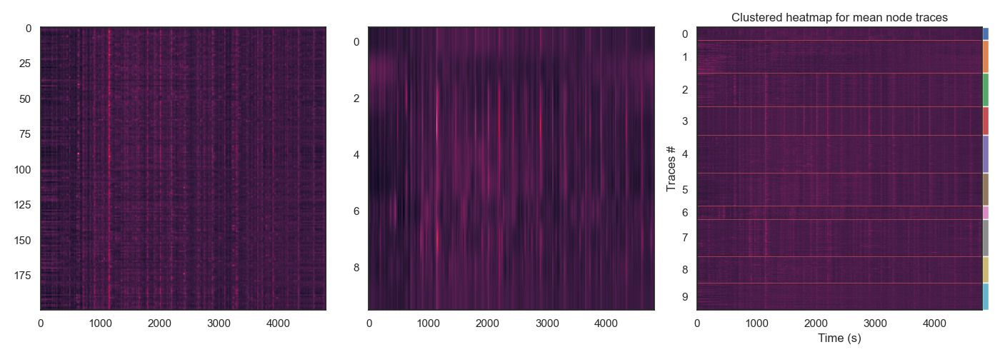

In [45]:
# Decision point: representative node activity
# TODO: 
# - Add a function that displays for the corresponding neuroal traces for functional clusters 
# - Add mean matrix transformation onto a function
# Sum the mean data and cluster them spatially
N=LR_centers.shape[0] # The number of clusters which is 2 * cluster per hemisphere
T = selected_traces.shape[0]
M_all = np.empty((T,N))

for c in range(N):
    sub_ind = np.squeeze(np.argwhere(indices==c)[:,0])
    if np.size(sub_ind) > 1:
        M_all[:,c] =  np.nanmean(selected_traces[:,sub_ind],axis=1)
    elif np.size(sub_ind) == 1:
        M_all[:,c] =  selected_traces[:,sub_ind]

# Extract relevant parameters
selected_clust = np.arange(0,10) # Select the first 5 clusters
select_neurons_ind = np.squeeze(np.argwhere(indices==selected_clust)[:,0]) # Select correspond neurons
select_neurons = selected_traces[:,select_neurons_ind].T
clus_id_arr = np.extract(np.squeeze(np.isin(indices, selected_clust)), indices)

# Plot mean node response along side the clustered neurons
fig_clus, axs = plt.subplots(1, 3, figsize=(14, 5))
# axs[0].imshow(M_all.T, aspect='auto',vmin = -1, vmax = 1)
axs[0].imshow(M_all.T, aspect='auto')
# axs[1].imshow(M_all.T[selected_clust], aspect='auto',vmin = -1, vmax = 1)
axs[1].imshow(M_all.T[selected_clust], aspect='auto')
mu.plot_cluster_heatmap(select_neurons, clus_id_arr, axs[2], dt=1.0, clust_colorbar_width=100) 

plt.tight_layout()
fig_clus.savefig(fig_save_path + '/clusters and corresponding neurons plot.png')

# plt.close('all')
# plt.clf 

#### **Decision point**: Decide which elements to regress out  
Regress out unwanted / uninteresting signals, including
- Global signals
- Motor regressor
Although in essence these might capture information we might need


In [46]:
# TODO: Regress out certain signals to fine-tune graph analysis (Maybe as a way of control)

#### **Decision point** - Select which functional connnectivity to use:
Select which dataset to work on and under which conditions:
* Correlation between nodes
* Euclidian Distance (Note: Isn't normalized between 0-1 so shouldn't be added)
* Granger Causality: Implemented
* Transfer Entropy TODO

In [47]:
# TODO: Add averaging of connectivity matrices across fish
# Generate various connectivity matrices and plot them
fc_dict = {} 
string_connectivity = ['correlation', 'z-correlation', 'euclidian distance', 'granger causality'] 
for con_type in string_connectivity:
    if con_type == 'granger causality':
        con_mat = fa.define_connectivity_matrix(M_all, con_type,  maxdelay=5, alpha=0.05)
        fc_dict.update({con_type: con_mat})  
    else:
        con_mat = fa.define_connectivity_matrix(M_all, con_type)
        fc_dict.update({con_type: con_mat})    

selected_con_mat = fa.define_connectivity_matrix(M_all, **param_dict['decision variables']['connectivity'])



C:\Users\micha\AppData\Roaming\Python\Python38\site-packages\sklearn\metrics\pairwise.py:58: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float


c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)


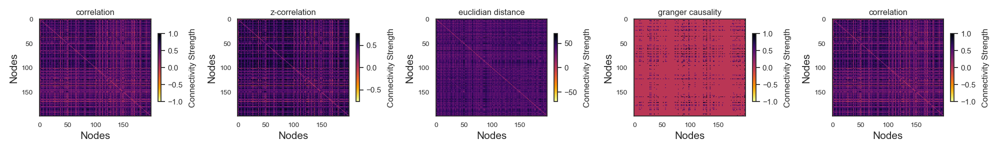

In [48]:
# TODO fix the fact that if length one of array thenthis code falls
fig_con, axs = plt.subplots(1, len(fc_dict)+1, figsize=(20, 3))
for index, (con_name, con_mat) in enumerate(fc_dict.items()):
    ga.plot_connectivity_matrix(con_mat,ax=axs[index],title=con_name)
ga.plot_connectivity_matrix(selected_con_mat,ax=axs[-1],title=param_dict['decision variables']['connectivity']['con_type'])
for spine in axes[-1].spines.values():
        spine.set_edgecolor('green')
plt.tight_layout()
fig_con.savefig(fig_save_path + '/connectivity metrices plot.png')

# # Save different connectivity matrices
func_d['Connectivity matrices'] = fc_dict

c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `h

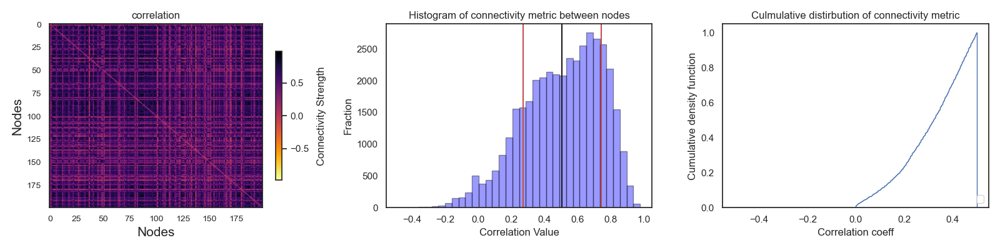

In [49]:
# TODO: Review statistics of correlations
# TODO: Turn this onto a function

selected_con_mat.mean(), selected_con_mat.std(), selected_con_mat.max(), selected_con_mat.min()

# Plotting a select matrix, histogram for correlation distribution and 
fig, axs = plt.subplots(1, 3, figsize=(len(fc_dict)*4, 4))

ga.plot_connectivity_matrix(selected_con_mat,ax=axs[0],title=param_dict['decision variables']['connectivity']['con_type'])
sns.distplot(selected_con_mat, hist=True, kde=False, 
             ax=axs[1], bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'}, kde_kws={'shade': True,'linewidth': 4})
axs[1].set_title('Histogram of connectivity metric between nodes')
axs[1].set_xlabel('Correlation Value'); axs[1].set_ylabel('Fraction');
axs[1].axvline(selected_con_mat.mean(), color='k')
axs[1].axvline(np.mean(selected_con_mat) + np.std(selected_con_mat), c='r')
axs[1].axvline(np.mean(selected_con_mat) - np.std(selected_con_mat), c='r')


###### plot cdf for Spearman correlation ######
bins = np.linspace(-0.5, 0.5, 500) # set bins in which to compute cdf
# plot cdf for every condition
n, bins, patches = axs[2].hist(np.abs(selected_con_mat).ravel(),
                            bins, density = True,
                            histtype = 'step', 
                            cumulative = True)
# fix axis and labels
axs[2].legend(loc = 4); 
axs[2].set_ylabel('Cumulative density function'); axs[2].set_xlabel('Correlation coeff')
axs[2].set_title('Culmulative distirbution of connectivity metric')
plt.tight_layout()

fig_con.savefig(fig_save_path + '/distribution of {} FC plot.png'.format(param_dict['decision variables']['connectivity']['con_type']))

# 
# plt.savefig(path_figures + str(kk) + '.png')

C:\Users\micha\AppData\Roaming\Python\Python38\site-packages\sklearn\metrics\pairwise.py:58: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
C:\Users\micha\AppData\Roaming\Python\Python38\site-packages\sklearn\metrics\pairwise.py:58: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
C:\Users\micha\AppData\Roami

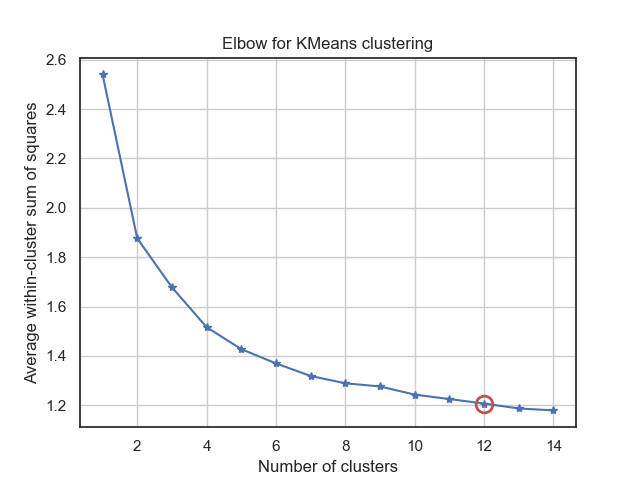

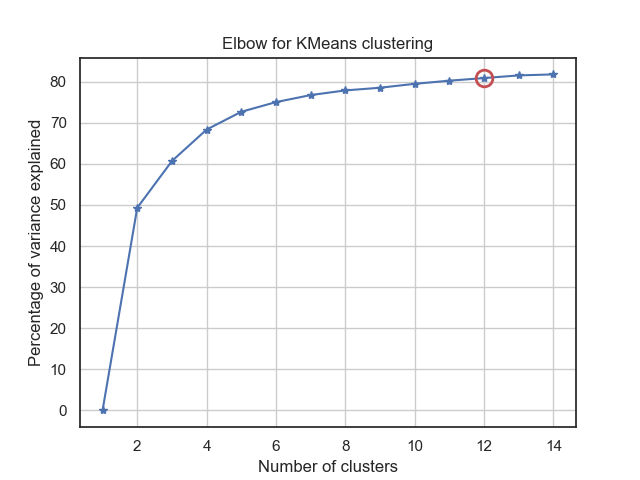

In [50]:
# Examine cluster amount to cnnfirm modularity and data syncronization
ac = fa.analyze_clustering(selected_con_mat, 15)
ac.plot_elbow(11)

c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will

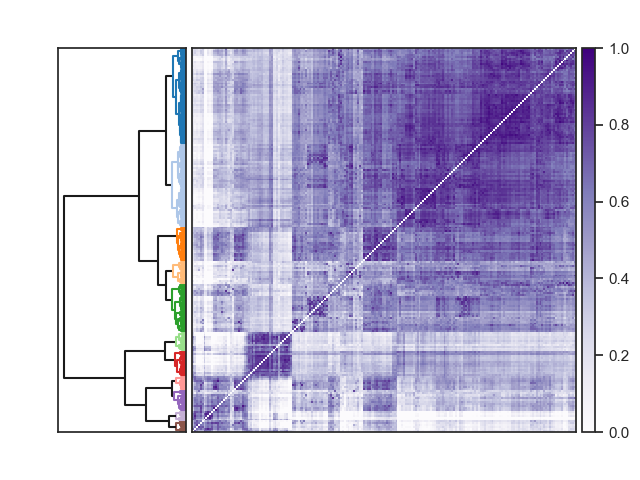

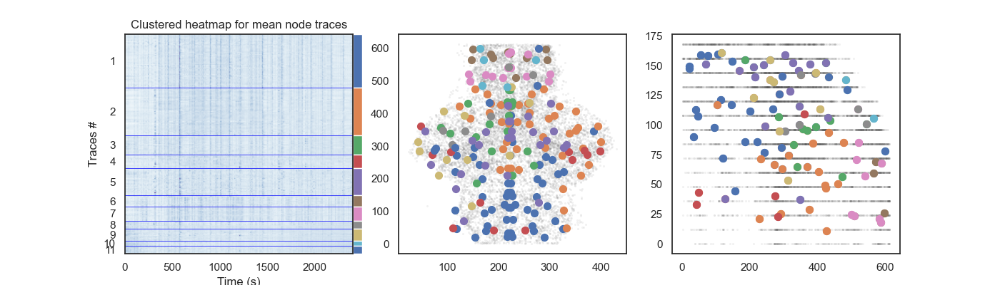

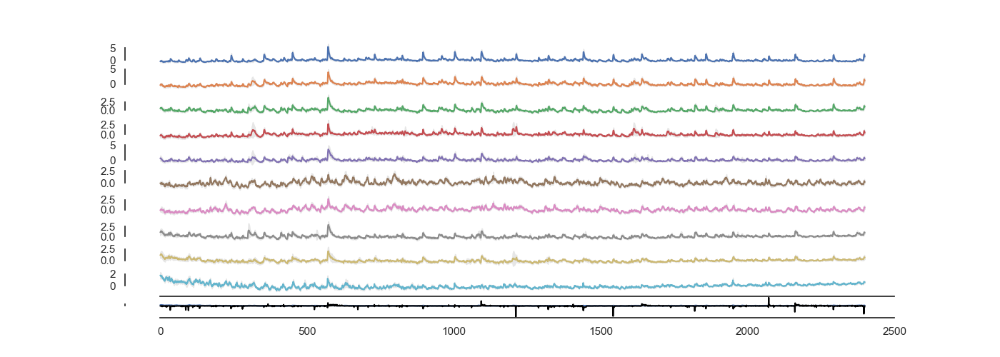

In [51]:
# TODO: (!) Add resampling to match time earlier 
n_clusters = 11


FC = fa.functional_clustering(np.nan_to_num(selected_con_mat))

# Supply Correlation matrix
FC.matrix = selected_con_mat

# Hierarchical clustering
FC.linkage()

# Save output cluster ids
FC.predict_cluster(k=n_clusters)

# plot hierarchical clustering matrix
fig_clust_dend = FC.plot_matrix()
fig_clust_dend.savefig(fig_save_path + '/clustered correlation map plot.png')
cluster_labels = FC.clusters

# Plot the ordered clustered map and anatomy
fig_clus_ana, axs = plt.subplots(1, 3, figsize=(14, 4))
mu.plot_cluster_heatmap(M_all.T[:,::int(zf)], cluster_labels, axs[0], dt=1.0, clust_colorbar_width=100, cmap='BuPu', clust_separator_color='blue') 
fa.plot_cluster_anatomy(cluster_labels, LR_centers, XYZ, axs[1:3])
fig_clus_ana.savefig(fig_save_path + '/clustered elements on anatomy and node traces plot.png')


# Plot traces for n clusters
fig_clus_traces, axs_traces = plt.subplots(n_clusters, 1, figsize=(14, 5))
swim_arr = ba.get_tail_sum(master_path / fish_id, goal_sampling_freq = 2400)

fa.plot_cluster_traces(M_all.T[:,::int(zf)], cluster_labels, axs_traces, swim_arr) 
fig_clus_traces.savefig(fig_save_path + '/clustered mean traces and deviation plot.png')


# plt.imshow(M_all.T[np.argsort(labels),:], aspect='auto', cmap='RdBu_r', vmin=-2.5, vmax=2.5)
# clusters_mean = [M_all.T[cluster_labels==i].mean(axis=0) for i in range(n_clusters)] # Extract clusters





# 

In [52]:
# r_test = correlation_matrix[0][4]
# p_value = sum(trace_corr_scores[0,:] < r_test ) / len(trace_corr_scores[0,:])
# p_value

# fig = plt.figure()
# p_values = plot_control_distribution(correlation_matrix, trace_corr_scores, 0, 4, with_plot=True)

#### **Decision point** - Select which thresholding you'll use:
There are currently three thresholding options to choose from:
* Correlation threshold (Good practice is around 0.6-0.7)
* Precentile threshold
* Rolling windows and correlation p-value calculation threshold

In [53]:
# TODO:
# Validate thresholding worked (Test) - take an example test from pyform
selected_thresh_mat = fa.threshold_correlation_mat(selected_con_mat, **param_dict['decision variables']['thresh'])


#### Summary: Validate the functional connectivity
There are several ways to validate function connectivity

c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)


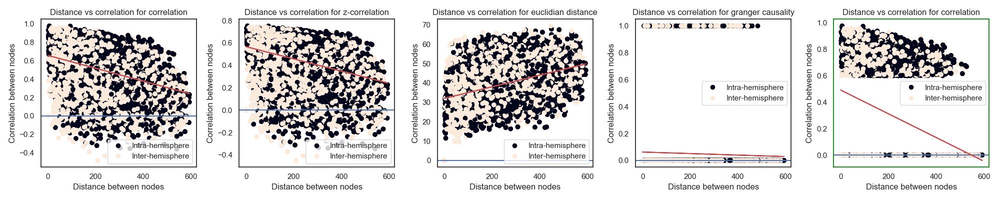

In [54]:
# This is one of the validation tests
# thresh_corr = ga.threshold_conn_by_constant(correlation_matrix,0.8)
# selected_connectivity = 'z-fisher correlation'
# z_correlation_matrix = fc_dict[selected_connectivity ]

# TODO: Turn into a function
# Plot correlation againts distance

# Generate the plot
fig, axes = plt.subplots(1,len(fc_dict)+1,figsize=(5*len(fc_dict),4))
coord_pos = list(zip(LR_centers[:,0],LR_centers[:,1]))
spatial_dist_mat = distance_matrix(coord_pos,coord_pos)
for index, (con_name, con_mat) in enumerate(fc_dict.items()):
    ga.plot_corr_vs_dist(spatial_dist_mat,  con_mat, ax=axes[index], title=con_name)

# Emphasize selected 
ga.plot_corr_vs_dist(spatial_dist_mat,  selected_thresh_mat, ax=axes[-1], title=param_dict['decision variables']['connectivity']['con_type'])
for spine in axes[-1].spines.values():
        spine.set_edgecolor('green')
plt.tight_layout()

# # TODO: Under how they implemented Fisher-Z (But why did they do it?)
# fz_Corr = np.arctanh(correlation_matrix)
fig.savefig(fig_save_path + '/Distance vs correlations plots.png')


In [55]:
# Save data in a json file for configuration parameters
with open(Path('../figures/{}'.format(fish_id)) / timestamp / 'analysis_protocol.json'.format(timestamp), 'w') as fp:
    json.dump(param_dict, fp)

# Save all the traces along the steps
fl.save(fig_save_path + '/analysis_matrices.h5', func_d)

# Save the final connectivity matrix
np.save(fig_save_path + '/connectivity_mat.npy', selected_thresh_mat) # save

c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\flammkuchen\hdf5io.py:153: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  elif x.dtype == np.object:
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\flammkuchen\hdf5io.py:153: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  elif x.dtype == np.object:
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\flammkuchen\hdf5io.py:153: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object

c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)
c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\ipywidgets\widgets\widget.py:443: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will

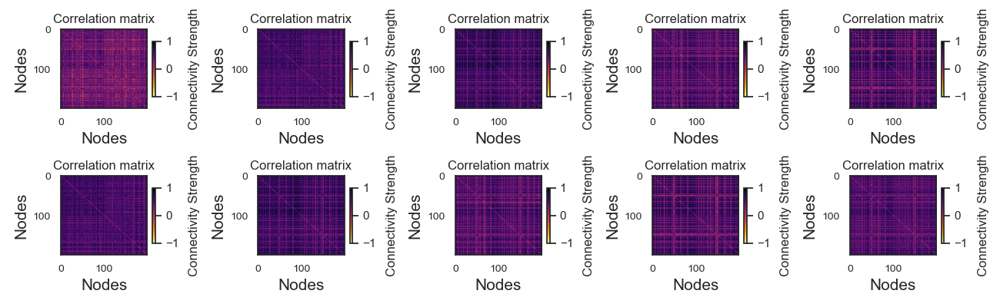

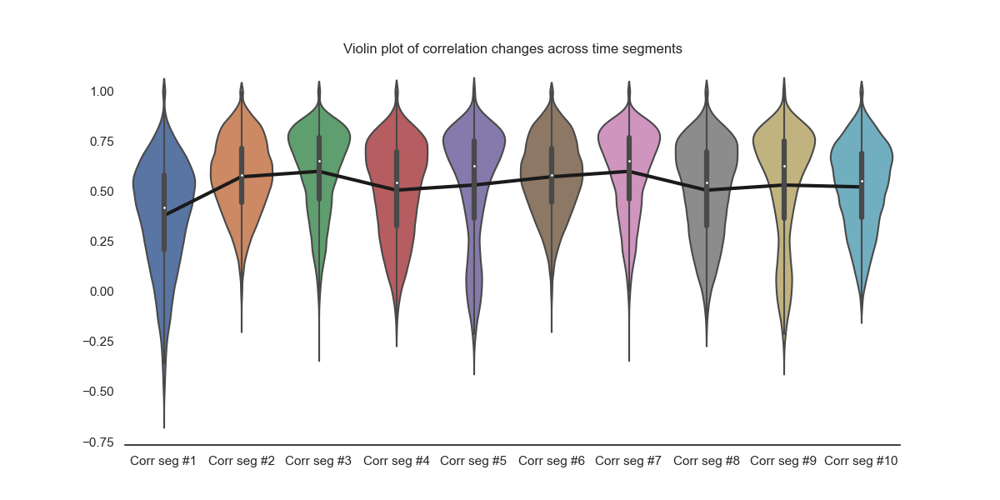

In [56]:
# TODO: Examine functional connectivity overtime
# Build the chunks
def build_chunks(arr, chunk_size, axis=1):
    return np.split(arr, range(chunk_size, arr.shape[axis], chunk_size), axis=axis) 
segmented_tc = build_chunks(TC, 480, axis=0) # Segment into 10 Chunks each of 240 secs, why just 10 chunks?

# Create new pandas dataframe
pd_nodes = pd.DataFrame()

# 
count = len(segmented_tc)
N=200
counter = 1
n_col = 2
n_rows = 5
correlation_measure = ConnectivityMeasure(kind='correlation')
fig, axs = plt.subplots(n_col , n_rows, figsize=(13, 4))
for i in range(n_col):
    for j in range(n_rows):
        current_TC = segmented_tc[i+j]
        T = current_TC.shape[0]
        M_all_seg = np.empty((T,N))
        for c in range(N):
            sub_ind = np.squeeze(np.argwhere(indices==c)[:,0])
            if np.size(sub_ind) > 1:
                M_all_seg[:,c] =  np.nanmean(current_TC[:,sub_ind],axis=1)
            elif np.size(sub_ind) == 1:
                M_all_seg[:,c] =  current_TC[:,sub_ind]
        correlation_matrix_seg = correlation_measure.fit_transform([M_all_seg])[0]
        pd_nodes["Corr seg #{}".format(counter)] = correlation_matrix_seg.ravel()
        ga.plot_connectivity_matrix(correlation_matrix_seg,ax=axs[i][j])
        counter+=1

fig.savefig(fig_save_path + '/FC Matrices across time segments.png')

plt.tight_layout()
# Create violin plots 
# feature = 'n_peaks' # number of peaks per min
# conditions = ["awake","iso","rec30","rec60","rec120","rec180","rec240","rec300","rec360"]

f, axes = plt.subplots(1, 1, figsize=(12, 6), sharex=True)
sns.despine(left=True)
# axes.set_ylim([0, 100.0])
# sns.violinplot(x='condition', data=df_estimators,ax=axes,order = conditions,scale='width',cut=0)
sns.pointplot(data=pd_nodes, markers='o', scale=1.1, color='k', ax=axes)
sns.violinplot(data=pd_nodes,ax=axes,scale='width')
plt.title('Violin plot of correlation changes across time segments')
f.savefig(fig_save_path + '/Violin of FC across time seg.png')

# sns.pointplot(x='condition', y=feature, markers='o', scale=1.1, color='k',data=df_estimators.groupby('condition', as_index=False)[feature].median(), ax=axes,order=conditions)
# plt.savefig("n_peaks.png")
# plt.savefig("n_peaks.eps")
    

In [57]:
# from ipywidgets import interact
# import ipywidgets as widgets
# %matplotlib inline
# %matplotlib widget

# # TODO: Implement different rhesholding methods threshold 


# def refresh_constant(corr_coef=.8):
#   fig, axs = plt.subplots(1,1,figsize=(6, 4))
#   const_thresh_corr_mat = ga.threshold_conn_by_constant(correlation_matrix,corr_coef)
#   ga.plot_connectivity_matrix(const_thresh_corr_mat,ax=axs,title='Constant')
#   plt.show()

# _ = widgets.interact(refresh_constant, corr_coef=(0,1, .1))

# # with output:

# from ipywidgets import interact
# import ipywidgets as widgets
# %matplotlib inline
# %matplotlib widget

# fig, ax = plt.subplots(figsize=(6, 4))

# def refresh_per(percentile=80):
#   fig, axs = plt.subplots(1, 1, figsize=(6, 6))
#   per_thresh_corr_mat = ga.threshold_conn_by_percentile(correlation_matrix, percentile)
#   ga.plot_connectivity_matrix(per_thresh_corr_mat,ax=axs,title='Percentile')
#   plt.show()

# _ = widgets.interact(refresh_per, percentile=(0, 100, .1))

# A decision point: Thresholding method
# Plot different thresholding

SyntaxError: invalid syntax (2909176381.py, line 32)

In [ ]:
# TODO: Select a time window of activity without motor traces 

In [ ]:
# TODO: Implement Embedding for clustering visualizations:
# TODO: Implement TSNE Embedding:
# TODO: mean trace


# fc = fc_pearson.copy()
# # Select embedding method for dimentional data: 
# # fc_embedded = TSNE(n_components=2, perplexity=5, learning_rate=100, n_iter=5000).fit_transform(fc_diag)
# fc_embedded = PCA(n_components=2).fit_transform(fc_diag)
# # Plot the results
# fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
# colors = ['g' if i==0 else 'r' for i in df['sex'].values]
# ax[0].set_title('target')
# colors = ['g' if i==0 else 'r' for i in df['target'].values]
# ax[0].scatter(fc_embedded[:, 0], fc_embedded[:, 1], alpha=0.2, c=colors)
# ax[1].set_title('sex')
# colors = ['g' if i==0 else 'r' for i in df['sex'].values]
# ax[1].scatter(fc_embedded[:, 0], fc_embedded[:, 1], alpha=0.2, c=colors)
# plt.show()